This notebook opens the MUSE files and plots them "Figures/AllMUSEGalaxies.png".
This notebook also writes the MUSE galaxies and their filenames in ../Data/MUSEdata.csv

The MUSE files have this address: /data/fourier/sun.1608/PHANGS/MUSE/DR2.2/MUSEDAP/copt/

and this one: PHANGS DRIVE -> archive -> MUSE -> DR2.2 -> copt -> MUSEDAP -> fiducial



In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import matplotlib.pyplot as plt
from astropy.io import fits
import astropy.io.fits as pyfits
import sys, os
# !{sys.executable} -m pip install aplpy
import numpy as np
import aplpy
from astropy.table import Table

In [3]:
PHANGS_table = Table.read("../Data/0.phangs_v1p6.csv")

In [4]:
# Organize MUSE galaxies and their information in MUSE table
# Filenames have following format:
# /data/fourier/sun.1608/PHANGS/MUSE/DR2.2/MUSEDAP/<copt OR 150pc OR 15asec>/<GALAXY>-<RES>_MAPS.fits

galaxies = ["IC5332", "NGC2835", "NGC0628", "NGC3351", "NGC1087", "NGC3627", "NGC1300", "NGC4254", "NGC1365",
            "NGC4303", "NGC1385", "NGC4321", "NGC1433", "NGC4535", "NGC1512", "NGC5068", "NGC1566", "NGC7496",
            "NGC1672"]

natRes = ["0.87", "1.15", "0.92", "1.05", "0.92", "1.05", "0.89", "0.89", "1.15", "0.78", "0.77", "1.16",
          "0.91", "0.56", "1.25", "1.04", "0.80", "0.89", "0.96"]

# Anand 2021
# distances = [9.0,12.2,9.8,10.0,15.9,11.3,19.0,13.1,19.6,17.0,17.2,15.2,18.6,15.8,18.8,5.2,17.7,18.7,19.4]
dists, pas, ras, decs, incls = [],[],[],[],[]


for i in range(len(galaxies)):
    for j in range(len(PHANGS_table)):
        if galaxies[i] == PHANGS_table["galaxy"][j].upper():
            dists.append(PHANGS_table["dist"][j])
            pas.append(PHANGS_table["orient_posang"][j])
            ras.append(PHANGS_table["orient_ra"][j])
            decs.append(PHANGS_table["orient_dec"][j])
            incls.append(PHANGS_table["orient_incl"][j])

    
fileNamesNat, fileNames150pc, fileNamesHII = [],[],[]

for i in range(len(galaxies)):
    beg = "../../GalaxyFiles/MUSELargeFiles/"
    end = "_MAPS.fits"
    
    fileNamesNat.append(beg + 'MUSE2.2_Nat/' + galaxies[i] + "-" + natRes[i] + "asec" + end)
    fileNames150pc.append(beg + "MUSE2.2_150pc/" + galaxies[i] + "-150pc" + end)
    fileNamesHII.append("../Data/HII_reg_masks/" + galaxies[i] + "_nebulae_mask_V2.fits")

MUSEtable = Table({"Galaxy":         galaxies, 
                   "Distance":       dists,
                   "GalRa":         ras,
                   "GalDec":        decs,
                   "PosAng":         pas,
                   "Incl":           incls,
                   "MUSENatRes":     natRes, 
                   "MUSEmapNat":     fileNamesNat,
                   "MUSEmap150pc":   fileNames150pc,
                   "MUSE_HII_reg":  fileNamesHII})

MUSEtable.sort("Galaxy")
MUSEtable.write('../Data/0.MUSEdata.csv', overwrite=True)  

MUSEtable


Galaxy,Distance,GalRa,GalDec,PosAng,Incl,MUSENatRes,MUSEmapNat,MUSEmap150pc,MUSE_HII_reg
str7,float64,float64,float64,float64,float64,str4,str71,str70,str50
IC5332,9.01,353.61453,-36.10108,74.4,26.9,0.87,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_Nat/IC5332-0.87asec_MAPS.fits,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_150pc/IC5332-150pc_MAPS.fits,../Data/HII_reg_masks/IC5332_nebulae_mask_V2.fits
NGC0628,9.84,24.173855,15.783643,20.7,8.9,0.92,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_Nat/NGC0628-0.92asec_MAPS.fits,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_150pc/NGC0628-150pc_MAPS.fits,../Data/HII_reg_masks/NGC0628_nebulae_mask_V2.fits
NGC1087,15.85,41.60492,-0.498717,359.1,42.9,0.92,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_Nat/NGC1087-0.92asec_MAPS.fits,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_150pc/NGC1087-150pc_MAPS.fits,../Data/HII_reg_masks/NGC1087_nebulae_mask_V2.fits
NGC1300,18.99,49.920815,-19.411114,278.0,31.8,0.89,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_Nat/NGC1300-0.89asec_MAPS.fits,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_150pc/NGC1300-150pc_MAPS.fits,../Data/HII_reg_masks/NGC1300_nebulae_mask_V2.fits
NGC1365,19.57,53.40152,-36.140404,201.1,55.4,1.15,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_Nat/NGC1365-1.15asec_MAPS.fits,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_150pc/NGC1365-150pc_MAPS.fits,../Data/HII_reg_masks/NGC1365_nebulae_mask_V2.fits
NGC1385,17.22,54.369015,-24.501162,181.3,44.0,0.77,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_Nat/NGC1385-0.77asec_MAPS.fits,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_150pc/NGC1385-150pc_MAPS.fits,../Data/HII_reg_masks/NGC1385_nebulae_mask_V2.fits
NGC1433,18.63,55.506195,-47.221943,199.7,28.6,0.91,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_Nat/NGC1433-0.91asec_MAPS.fits,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_150pc/NGC1433-150pc_MAPS.fits,../Data/HII_reg_masks/NGC1433_nebulae_mask_V2.fits
...,...,...,...,...,...,...,...,...,...
NGC3627,11.32,170.06252,12.9915,173.1,57.3,1.05,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_Nat/NGC3627-1.05asec_MAPS.fits,../../GalaxyFiles/MUSELargeFiles/MUSE2.2_150pc/NGC3627-150pc_MAPS.fits,../Data/HII_reg_masks/NGC3627_nebulae_mask_V2.fits


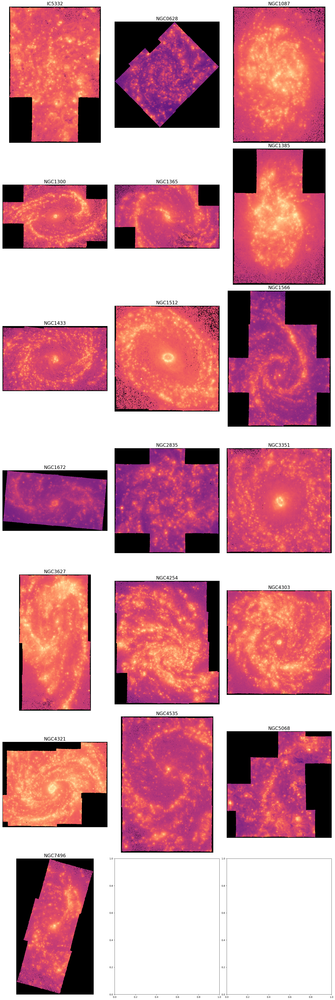

In [5]:
# set up plots & wcs information.
import matplotlib.pyplot as plt
from astropy.wcs import WCS
plots, wcss, hdus = [],[],[]

for i in range(len(MUSEtable)):
    fileName = MUSEtable["MUSEmapNat"][i]
    if os.path.isfile(fileName):
        MUSE_hdu = fits.open(fileName)
        hdus.append(MUSE_hdu)
        MUSE_map = MUSE_hdu["HA6562_FLUX"].data
        plots.append(MUSE_map)
        wcss.append(WCS(MUSE_hdu["HA6562_FLUX"].header, naxis=2))
    else:
        print("no file: ", fileName)

current_cmap = plt.get_cmap("magma")
current_cmap.set_bad("black")

# make multipanel plot of MUSE galaxies 
import math
i,j,m=0,0,0
PLOTS_PER_ROW = 3
fig, axs = plt.subplots(math.ceil(len(plots)/PLOTS_PER_ROW),PLOTS_PER_ROW, figsize=(20, 60))
for plot in plots:
    logplot = np.log10(plot)
    axs[i][j].imshow(logplot, cmap=current_cmap, aspect="equal", origin = "lower", interpolation = "nearest")
    axs[i][j].set_title(MUSEtable["Galaxy"][m].upper(), fontsize=20)
    axs[i][j].set_xticks([])
    axs[i][j].set_yticks([])
    j+=1
    if j%PLOTS_PER_ROW==0:
        i+=1
        j=0
    m+=1
plt.tight_layout(pad=0.1, w_pad=0.1, h_pad=0.1)
plt.show()
fig.savefig("../Figures/AllMUSEGalaxies.png", dpi=300)
plt.close()

